In [50]:
import os
import pandas as pd
import gc
gc.collect()

LENDING_PATH = os.path.join("data")
LENDING_FILE = "loan.csv"
BACKUP_FILE = "backup.csv"


### Load Data Set
def load_lending_data(lending_path = LENDING_PATH, lending_file = LENDING_FILE):
    csv_path = os.path.join(lending_path, lending_file)
    return pd.read_csv(csv_path, low_memory=False)

def load_backup_data(lending_path = LENDING_PATH, backup_file = BACKUP_FILE):
    csv_path = os.path.join(lending_path, backup_file)
    return pd.read_csv(csv_path, low_memory=False)

def writeLendingData(lending_path = LENDING_PATH, backup_file = BACKUP_FILE):
    csv_path = os.path.join(lending_path, backup_file)
    lending.to_csv(csv_path, index=None, header=True)


def drop_irrelevant_columns(columnList):
    lending.drop(columnList, axis=1, inplace=True)  
    gc.collect()
    

In [16]:
## Remove data not available prior to loan being established.
miscColumns = ['id', 'member_id', 'emp_title', 'desc', 'zip_code', 'title', 
               'url', 'policy_code'
              ]

hardshipColumns = ['hardship_flag', 'hardship_type', 'hardship_reason', 
                   'hardship_status', 'deferral_term', 'hardship_amount', 
                   'hardship_start_date', 'hardship_end_date', 
                   'payment_plan_start_date', 'hardship_length', 'hardship_dpd', 
                   'hardship_loan_status', 'orig_projected_additional_accrued_interest', 
                   'hardship_payoff_balance_amount', 'hardship_last_payment_amount',
                   'pymnt_plan'
                  ]

settlementColumns = ['debt_settlement_flag', 'debt_settlement_flag_date',
                     'settlement_status','settlement_date','settlement_amount', 
                     'settlement_percentage', 'settlement_term'
                    ]

fundsReceviedColumns = ['total_pymnt', 'total_pymnt_inv', 'total_rec_int', 
                        'total_rec_late_fee', 'total_rec_prncp'
                       ]

postLoanInformation = ['out_prncp', 'out_prncp_inv']

loanPaymentColumns = ['last_pymnt_amnt', 'last_pymnt_d','next_pymnt_d',
                      'recoveries'
                     ]

In [17]:
## Load the data set
lending = load_lending_data()
#recovery = lending.copy()
#lending = recovery


In [18]:
## Drop irrelevant columns that we are know of
drop_irrelevant_columns(miscColumns)
drop_irrelevant_columns(hardshipColumns)
drop_irrelevant_columns(settlementColumns)
drop_irrelevant_columns(fundsReceviedColumns)
drop_irrelevant_columns(loanPaymentColumns)
drop_irrelevant_columns(postLoanInformation)

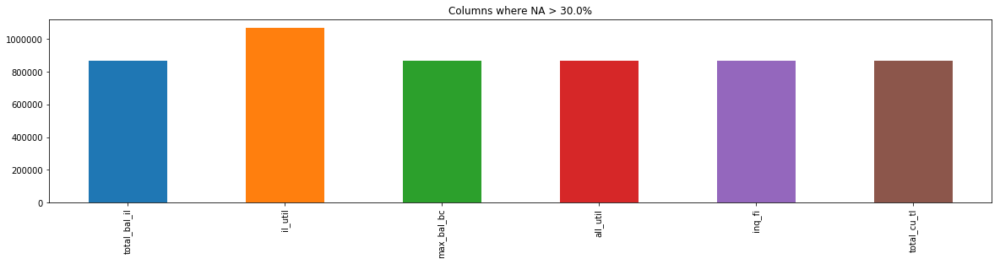

In [59]:

import matplotlib.pyplot as plt
%matplotlib inline

## Define % missing
PCT_MISSING = .30

## Let's drop any columns w/more than %30 of the data misssing for now
def remove_NaNs(pctMissing = PCT_MISSING): 
    dfShape = lending.shape
    cols = (lending.isnull().sum()/len(lending))
    cols = list(cols[cols.values>=pctMissing].index)
    lending.drop(labels = cols,axis =1,inplace=True)        
    print("Number of Columns dropped\t: ",len(cols))
    print("\nBefore: rows,columns",dfShape,"\nAfter rows,columns",lending.shape)

### Let's determine the number of missing values where it's greater than PCT_MISSING
def showMissingValues(pctMissing = PCT_MISSING):
    selectedColumns = lending.isnull().sum()
    return selectedColumns[selectedColumns.values > (pctMissing*len(lending))]

def plotMissingValues():
    ## Determine missing values and plot
    missingValues = showMissingValues()
    plt.figure(figsize=(20,4))
    missingValues.plot(kind='bar')
    title = 'Columns where NA > ' + str(PCT_MISSING*100) + '%'
    plt.title(title)
    plt.show
    
plotMissingValues()

The following attributes have greater than 30% values missing.  Most of these attributes are related to a secondary applicant which makes sense as not all applicants will have a joint or secondary applicant.  Let's determine if we should remove the secondary applicant data.

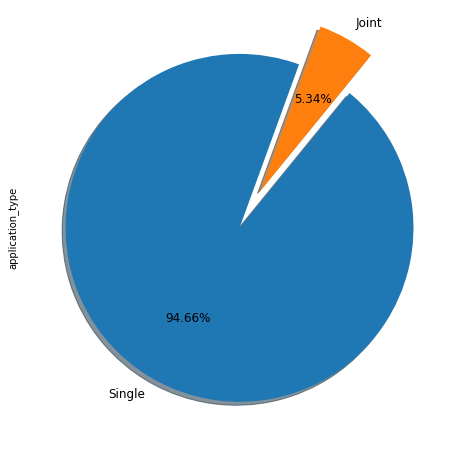

In [20]:
lending["application_type"].value_counts().plot.pie(explode=[0,0.25], autopct='%1.2f%%', 
                                                    shadow=True, labels=("Single","Joint"),
                                                   fontsize=12, startangle=70,figsize=(16,8))



In [63]:
#writeLendingData()
lending = load_backup_data()

- Secondary applicants makes up less than 5.5% of the data but account for a large number of missing values.  Let's remove the joint applicant data and focus on the primary borrower.

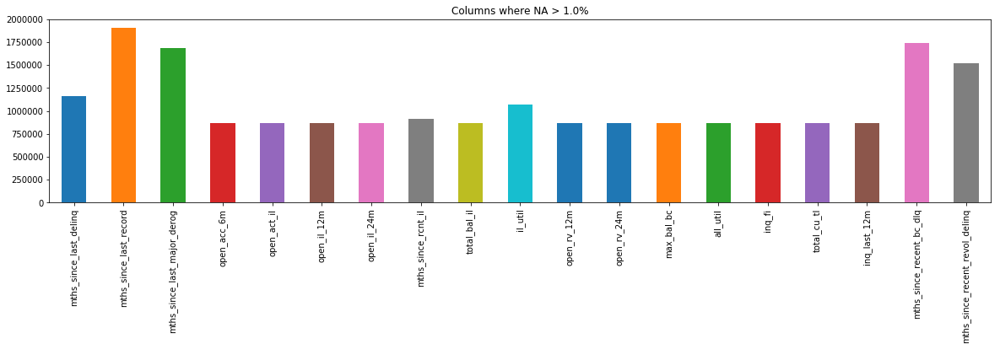

In [64]:
def dropJointApplicant():
    jointApplicantColumns = [
                             'sec_app_earliest_cr_line', 'sec_app_inq_last_6mths', 
                             'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 
                             'sec_app_open_act_il', 'sec_app_num_rev_accts', 
                             'sec_app_chargeoff_within_12_mths', 
                             'sec_app_collections_12_mths_ex_med', 
                             'sec_app_mths_since_last_major_derog',
                             'annual_inc_joint', 'dti_joint', 'revol_bal_joint',
                             'verification_status_joint'
                        ]
    drop_irrelevant_columns(jointApplicantColumns)

dropJointApplicant()
plotMissingValues()

- Let's assume the missing remaining missing values are associated with don't have a delinquency on their report therefore the value should be a value that's greater than 10 years.  

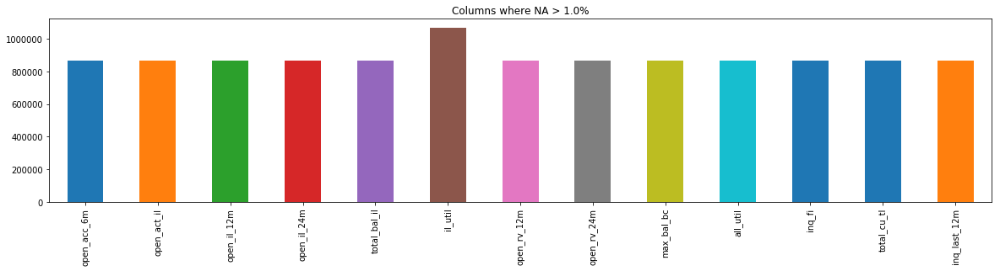

In [65]:
lending['mths_since_last_delinq'].fillna(71, inplace=True)
lending['mths_since_last_major_derog'].fillna(71, inplace=True)
lending['mths_since_last_record'].fillna(71, inplace=True)
lending['mths_since_rcnt_il'].fillna(71, inplace=True)
lending['mths_since_recent_bc'].fillna(71, inplace=True)
lending['mths_since_recent_bc_dlq'].fillna(71, inplace=True)
lending['mths_since_recent_inq'].fillna(71, inplace=True)
lending['mths_since_recent_revol_delinq'].fillna(71, inplace=True)
plotMissingValues()


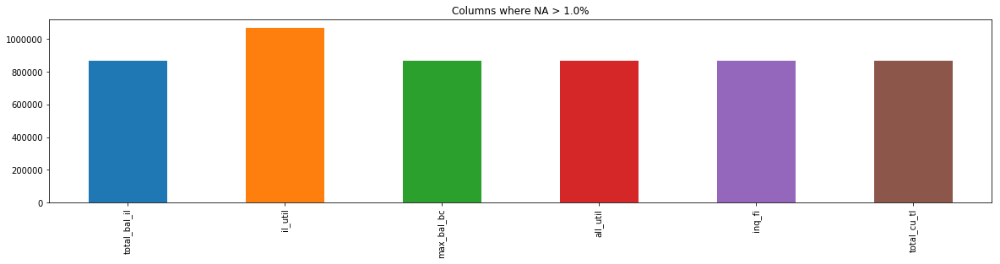

In [66]:
lending['open_acc'].fillna(0, inplace=True)
lending['open_acc_6m'].fillna(0, inplace=True)
lending['open_il_12m'].fillna(0, inplace=True)
lending['open_il_24m'].fillna(0, inplace=True)
lending['open_act_il'].fillna(0, inplace=True)
lending['open_rv_12m'].fillna(0, inplace=True)
lending['open_rv_24m'].fillna(0, inplace=True)
lending['inq_last_12m'].fillna(0, inplace=True)
plotMissingValues()

In [69]:
## Let's remove rows where NaNs are greater than 30%
remove_NaNs()

Number of Columns dropped	:  0

Before: rows,columns (2260668, 83) 
After rows,columns (2260668, 83)


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,disbursement_method
0,2500,2500,2500.0,36 months,13.56,84.92,C,C1,10+ years,RENT,...,3.0,100.0,0.0,1.0,0.0,60124.0,16901.0,36500.0,18124.0,Cash
1,30000,30000,30000.0,60 months,18.94,777.23,D,D2,10+ years,MORTGAGE,...,6.0,95.0,0.0,1.0,0.0,372872.0,99468.0,15000.0,94072.0,Cash
2,5000,5000,5000.0,36 months,17.97,180.69,D,D1,6 years,MORTGAGE,...,0.0,100.0,0.0,0.0,0.0,136927.0,11749.0,13800.0,10000.0,Cash
3,4000,4000,4000.0,36 months,18.94,146.51,D,D2,10+ years,MORTGAGE,...,3.0,100.0,100.0,0.0,0.0,385183.0,36151.0,5000.0,44984.0,Cash
4,30000,30000,30000.0,60 months,16.14,731.78,C,C4,10+ years,MORTGAGE,...,5.0,92.3,0.0,0.0,0.0,157548.0,29674.0,9300.0,32332.0,Cash


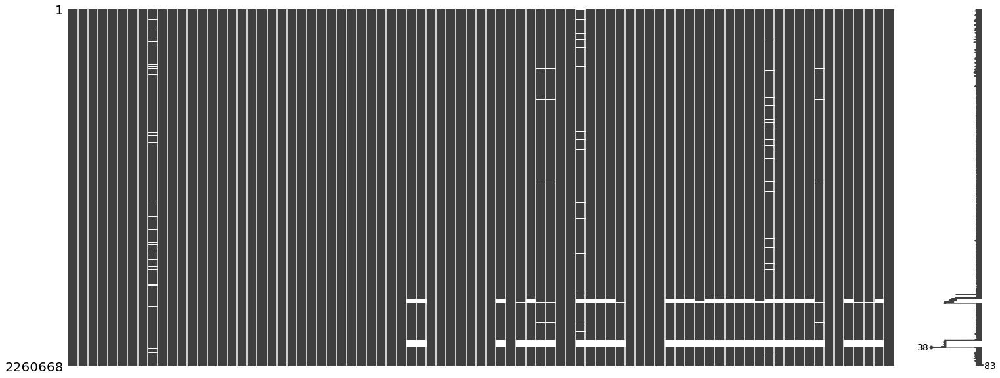

In [76]:
import missingno as msno
msno.matrix(lending)

In [78]:
import pandas_profiling as pp
pp.ProfileReport(lending)

If we are focusing on predicting whether a loan is good or bad we shouldn't be concerned with things that happened after the loan was placed.  We want to focus on attributes that are availabe be for funding of the loan. 

This is a very large dataset with a sizable number of features.  We will focus initially on attributes that give a view on Lending Club's business model:
- Borrower applies for a loan, borrowers is approved and funded, borrower repays loan over time
- Investors sign up with Lending Club, inverstors loan money to borrowers, investors earn a return on their investment and choose to either reinvest or not

We'll explore the following initially to get an idea of how much is flowing in and out.

In [ ]:
lending["loan_status"].value_counts()

In [ ]:
### Let's determine the number of missing values where it's greater than 30%
import matplotlib.pyplot as plt
%matplotlib inline
miss_col = lending.isnull().sum()
miss_col = miss_col[miss_col.values > (0.5*len(lending))]
plt.figure(figsize=(20,4))
miss_col.plot(kind='bar')
plt.title('Columns where NA > 50%')
plt.show

# Appendix

## Column Descriptions

| BrowseNotesFile | Description |
| --------------- | ----------- |
|acceptD | The date which the borrower accepted  the offer |
| accNowDelinq | The number of accounts on which the borrower is now delinquent. |
| accOpenPast24Mths | Number of trades opened in past 24 months. |
| addrState | The state provided by the borrower in the loan application |
| all_util | Balance to credit limit on all trades |
| annual_inc_joint | The combined self-reported annual income provided by the co-borrowers during registration |
| annualInc | The self-reported annual income provided by the borrower during registration. |
| application_type | Indicates whether the loan is an individual application or a joint application with two co-borrowers |
| avg_cur_bal | Average current balance of all accounts |
| bcOpenToBuy | Total open to buy on revolving bankcards. |
| bcUtil | Ratio of total current balance to high credit/credit limit for all bankcard accounts. |
| chargeoff_within_12_mths | Number of charge-offs within 12 months |
| collections_12_mths_ex_med | Number of collections in 12 months excluding medical collections |
| creditPullD | The date LC pulled credit for this loan |
| delinq2Yrs | The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years |
| delinqAmnt | The past-due amount owed for the accounts on which the borrower is now delinquent. |
| desc | Loan description provided by the borrower |
| dti | A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income. |
| dti_joint | A ratio calculated using the co-borrowers' total monthly payments on the total debt obligations, excluding mortgages and the requested LC loan, divided by the co-borrowers' combined self-reported monthly income |
| earliestCrLine | The date the borrower's earliest reported credit line was opened |
| effective_int_rate | The effective interest rate is equal to the interest rate on a Note reduced by Lending Club's estimate of the impact of uncollected interest prior to charge off. |
| emp_title | The job title supplied by the Borrower when applying for the loan.* |
| empLength | Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. |
| expD | The date the listing will expire |
| expDefaultRate | The expected default rate of the loan. |
| ficoRangeHigh | The upper boundary range the borrower’s FICO at loan origination belongs to. |
| ficoRangeLow | The lower boundary range the borrower’s FICO at loan origination belongs to. |
| fundedAmnt | The total amount committed to that loan at that point in time. |
| grade | LC assigned loan grade |
| homeOwnership | The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER. |
| id | A unique LC assigned ID for the loan listing. |
| il_util | Ratio of total current balance to high credit/credit limit on all install acct |
| ils_exp_d | wholeloan platform expiration date |
| initialListStatus | The initial listing status of the loan. Possible values are – W, F |
| inq_fi | Number of personal finance inquiries |
| inq_last_12m | Number of credit inquiries in past 12 months |
| inqLast6Mths | The number of inquiries in past 6 months (excluding auto and mortgage inquiries) |
| installment | The monthly payment owed by the borrower if the loan originates. |
| intRate | Interest Rate on the loan |
| isIncV | Indicates if income was verified by LC, not verified, or if the income source was verified |
| listD | The date which the borrower's application was listed on the platform. |
| loanAmnt | The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value. |
| max_bal_bc | Maximum current balance owed on all revolving accounts |
| memberId | A unique LC assigned Id for the borrower member. |
| mo_sin_old_rev_tl_op | Months since oldest revolving account opened |
| mo_sin_rcnt_rev_tl_op | Months since most recent revolving account opened |
| mo_sin_rcnt_tl | Months since most recent account opened |
| mortAcc | Number of mortgage accounts. |
| msa | Metropolitan Statistical Area of the borrower. |
| mths_since_last_major_derog | Months since most recent 90-day or worse rating |
| mths_since_oldest_il_open | Months since oldest bank installment account opened |
| mths_since_rcnt_il | Months since most recent installment accounts opened |
| mthsSinceLastDelinq | The number of months since the borrower's last delinquency. |
| mthsSinceLastRecord | The number of months since the last public record. |
| mthsSinceMostRecentInq | Months since most recent inquiry. |
| mthsSinceRecentBc | Months since most recent bankcard account opened. |
| mthsSinceRecentLoanDelinq | Months since most recent personal finance delinquency. |
| mthsSinceRecentRevolDelinq | Months since most recent revolving delinquency. |
| num_accts_ever_120_pd | Number of accounts ever 120 or more days past due |
| num_actv_bc_tl | Number of currently active bankcard accounts |
| num_actv_rev_tl | Number of currently active revolving trades |
| num_bc_sats | Number of satisfactory bankcard accounts |
| num_bc_tl | Number of bankcard accounts |
| num_il_tl | Number of installment accounts |
| num_op_rev_tl | Number of open revolving accounts |
| num_rev_accts | Number of revolving accounts |
| num_rev_tl_bal_gt_0 | Number of revolving trades with balance >0 |
| num_sats | Number of satisfactory accounts |
| num_tl_120dpd_2m | Number of accounts currently 120 days past due (updated in past 2 months) |
| num_tl_30dpd | Number of accounts currently 30 days past due (updated in past 2 months) |
| num_tl_90g_dpd_24m | Number of accounts 90 or more days past due in last 24 months |
| num_tl_op_past_12m | Number of accounts opened in past 12 months |
| open_acc_6m | Number of open trades in last 6 months |
| open_il_12m | Number of installment accounts opened in past 12 months |
| open_il_24m | Number of installment accounts opened in past 24 months |
| open_act_il | Number of currently active installment trades |
| open_rv_12m | Number of revolving trades opened in past 12 months |
| open_rv_24m | Number of revolving trades opened in past 24 months |
| openAcc | The number of open credit lines in the borrower's credit file. |
| pct_tl_nvr_dlq | Percent of trades never delinquent |
| percentBcGt75 | Percentage of all bankcard accounts > 75% of limit. |
| pub_rec_bankruptcies | Number of public record bankruptcies |
| pubRec | Number of derogatory public records |
| purpose | A category provided by the borrower for the loan request. |
| reviewStatus | The status of the loan during the listing period. Values: APPROVED, NOT_APPROVED. |
| reviewStatusD | The date the loan application was reviewed by LC |
| revolBal | Total credit revolving balance |
| revolUtil | Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit. |
| serviceFeeRate | Service fee rate paid by the investor for this loan. |
| subGrade | LC assigned loan subgrade |
| tax_liens | Number of tax liens |
| term | The number of payments on the loan. Values are in months and can be either 36 or 60. |
| title | The loan title provided by the borrower |
| tot_coll_amt | Total collection amounts ever owed |
| tot_cur_bal | Total current balance of all accounts |
| tot_hi_cred_lim | Total high credit/credit limit |
| total_bal_il | Total current balance of all installment accounts |
| total_cu_tl | Number of finance trades |
| total_il_high_credit_limit | Total installment high credit/credit limit |
| total_rev_hi_lim | Total revolving high credit/credit limit |
| totalAcc | The total number of credit lines currently in the borrower's credit file |
| totalBalExMort | Total credit balance excluding mortgage |
| totalBcLimit | Total bankcard high credit/credit limit |
| url | URL for the LC page with listing data. |
| verified_status_joint | Indicates if the co-borrowers' joint income was verified by LC, not verified, or if the income source was verified |
| zip_code | The first 3 numbers of the zip code provided by the borrower in the loan application. |
| revol_bal_joint | Sum of revolving credit balance of the co-borrowers, net of duplicate balances |
| sec_app_fico_range_low | FICO range (high) for the secondary applicant |
| sec_app_fico_range_high | FICO range (low) for the secondary applicant |
| sec_app_earliest_cr_line | Earliest credit line at time of application for the secondary applicant |
| sec_app_inq_last_6mths | Credit inquiries in the last 6 months at time of application for the secondary applicant |
| sec_app_mort_acc | Number of mortgage accounts at time of application for the secondary applicant |
| sec_app_open_acc | Number of open trades at time of application for the secondary applicant |
| sec_app_revol_util | Ratio of total current balance to high credit/credit limit for all revolving accounts |
| sec_app_open_act_il | Number of currently active installment trades at time of application for the secondary applicant |
| sec_app_num_rev_accts | Number of revolving accounts at time of application for the secondary applicant |
| sec_app_chargeoff_within_12_mths | Number of charge-offs within last 12 months at time of application for the secondary applicant |
| sec_app_collections_12_mths_ex_med | Number of collections within last 12 months excluding medical collections at time of application for the secondary applicant |
| sec_app_mths_since_last_major_derog | Months since most recent 90-day or worse rating at time of application for the secondary applicant |
| disbursement_method | The method by which the borrower receives their loan. Possible values are: CASH, DIRECT_PAY |



In [ ]:
lending.info(1)